In [1]:
import numpy as np
import torch
import cv2
import os
import torchvision
from PIL import Image
import torch.nn.functional as F
import importlib
import voc12.custom_data
from torchvision import transforms
from tool import pyutils, imutils, torchutils, visualization
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

In [20]:
def color_map(N=256, normalized=False):
    def bitget(byteval, idx):
        return ((byteval & (1 << idx)) != 0)

    dtype = 'float32' if normalized else 'uint8'
    cmap = np.zeros((N, 3), dtype=dtype)
    for i in range(N):
        r = g = b = 0
        c = i
        for j in range(8):
            r = r | (bitget(c, 0) << 7-j)
            g = g | (bitget(c, 1) << 7-j)
            b = b | (bitget(c, 2) << 7-j)
            c = c >> 3

        cmap[i] = np.array([r, g, b])

    cmap = cmap/255 if normalized else cmap
    return cmap


def color_map_viz():
    labels = ['background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat',
              'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person', 'pottedplant',
              'sheep', 'sofa', 'train', 'tvmonitor', 'void']
    nclasses = 21
    row_size = 50
    col_size = 500
    cmap = color_map()
    array = np.empty((row_size*(nclasses+1), col_size, cmap.shape[1]), dtype=cmap.dtype)
    for i in range(nclasses):
        array[i*row_size:i*row_size+row_size, :] = cmap[i]
    array[nclasses*row_size:nclasses*row_size+row_size, :] = cmap[-1]

    imshow(array)
    plt.yticks([row_size*i+row_size/2 for i in range(nclasses+1)], labels)
    plt.xticks([])
    plt.show()

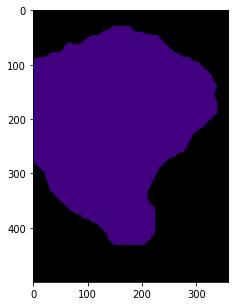

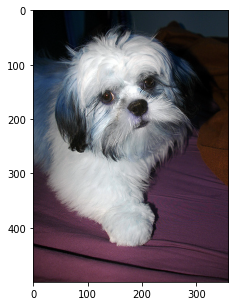

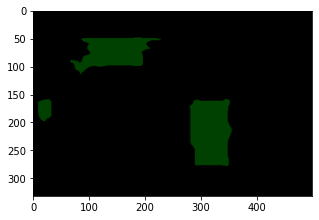

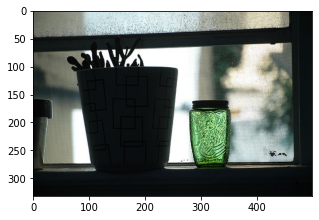

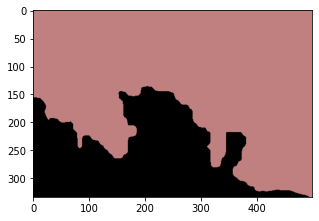

...

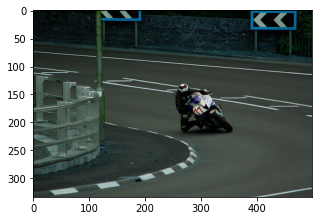

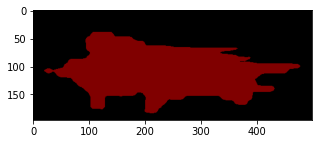

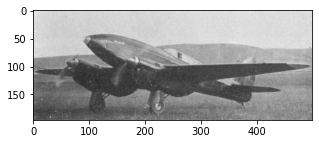

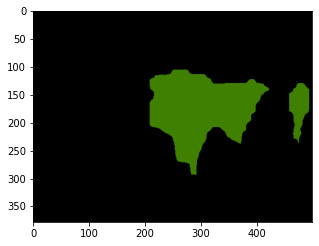

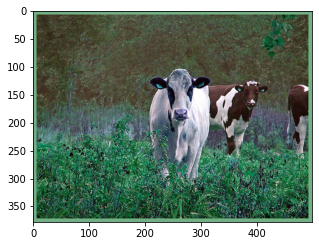

KeyboardInterrupt: Interrupted by user

In [21]:
path = '/data/sonnh8/SEAM/SEAM/Result/val_rw'
voc = '/data/sonnh8/SEAM/VOCdevkit/VOC2012/JPEGImages'
cmap = color_map()
for name in os.listdir(path):
    fp = os.path.join(path, name)
    im_path = os.path.join(voc, name[:-3]+'jpg')
    img = cv2.imread(im_path)
    cam = cv2.imread(fp, cv2.IMREAD_UNCHANGED)
    cam = cmap[cam]
#     print(cam[cam > 0])
    plt.figure(figsize=(5, 5))
    plt.imshow(cam)
    plt.figure(figsize=(5, 5))
    plt.imshow(img)
    plt.show()
    input()

In [22]:
model = getattr(importlib.import_module('network.resnet38_SEAM'), 'Net')()
model.load_state_dict(torch.load('resnet38_SEAM.pth'))

model.eval()
model.cuda()

def prob2heatmap(prob_map):
    heatmap = cv2.applyColorMap((prob_map*255).astype('uint8'), cv2.COLORMAP_JET)
    return heatmap

(448, 448, 3) tensor([[0., 1.]], dtype=torch.float64)


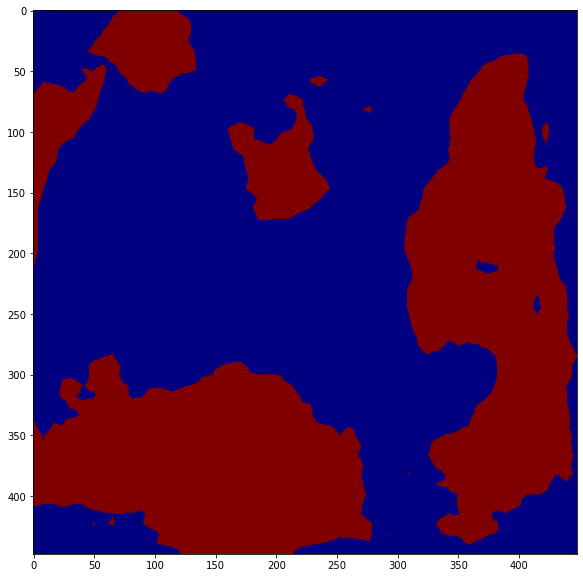

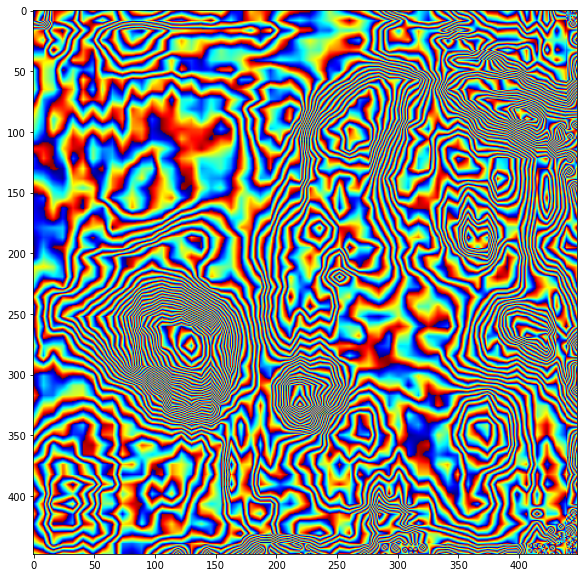

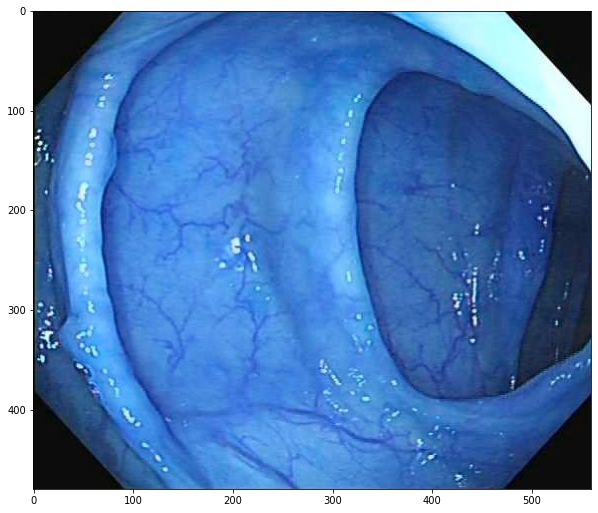


(448, 448, 3) tensor([[0., 1.]], dtype=torch.float64)


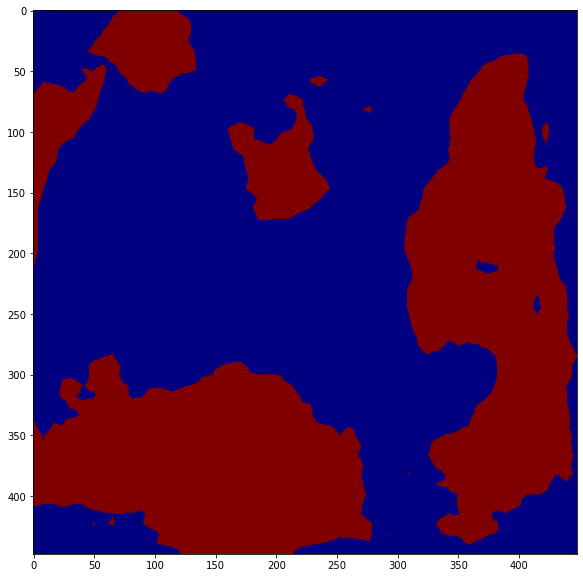

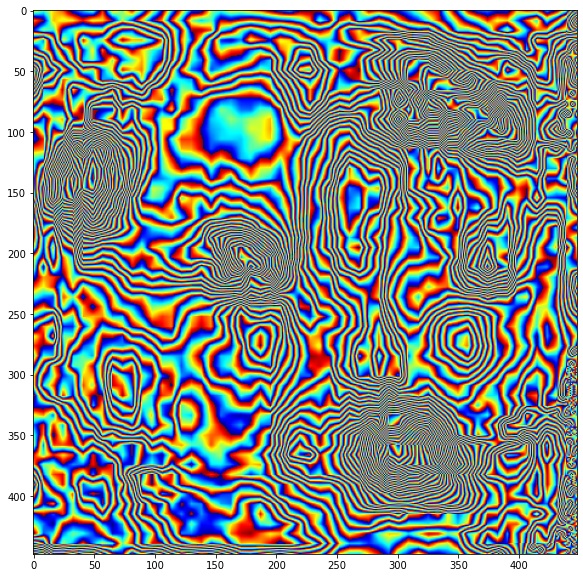

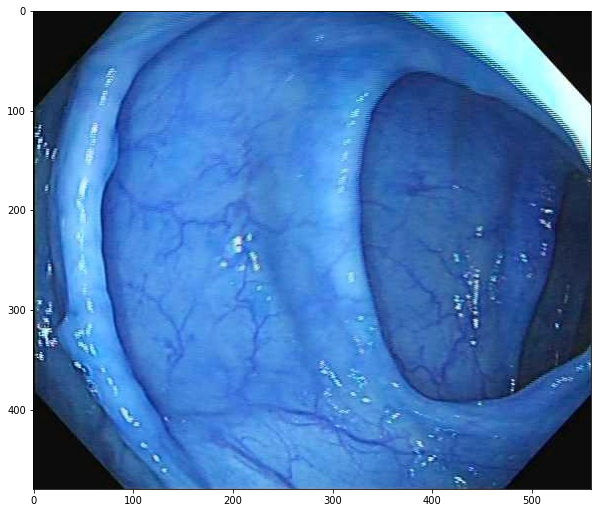


(448, 448, 3) tensor([[0., 1.]], dtype=torch.float64)


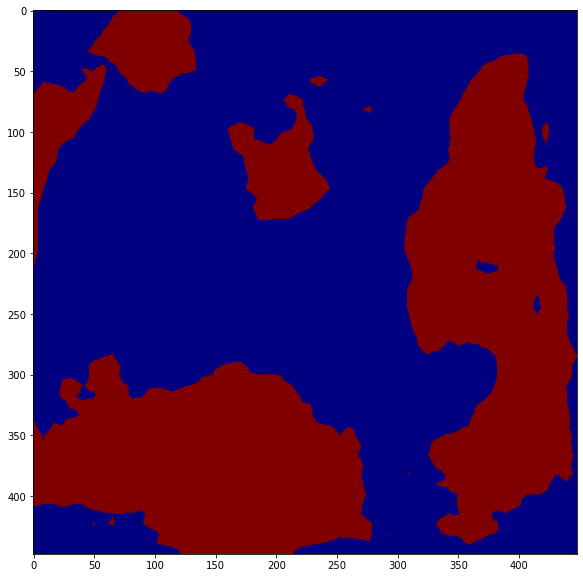

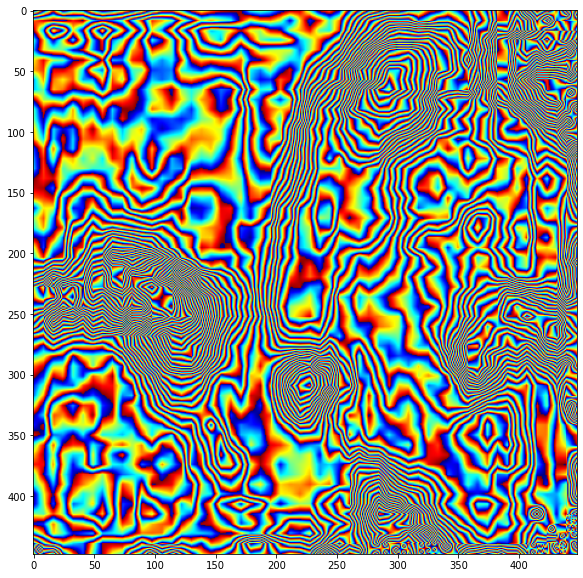

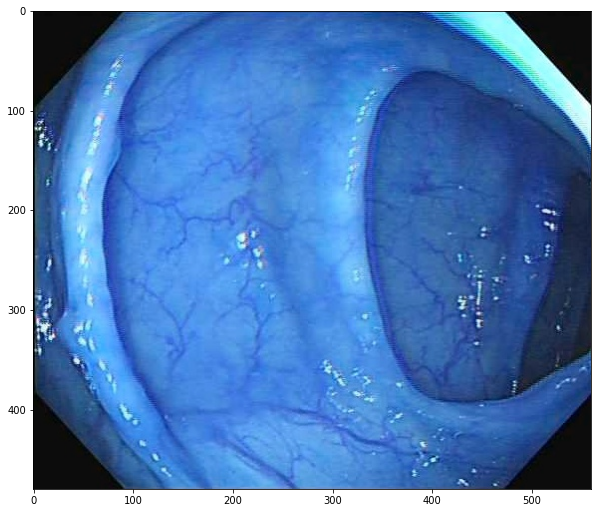


(448, 448, 3) tensor([[0., 1.]], dtype=torch.float64)


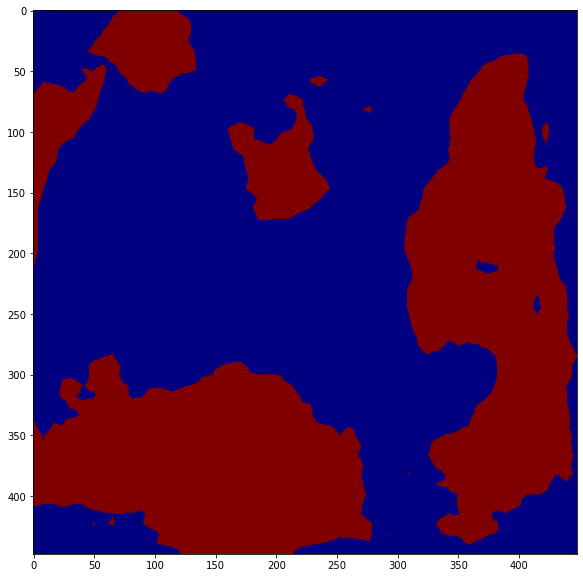

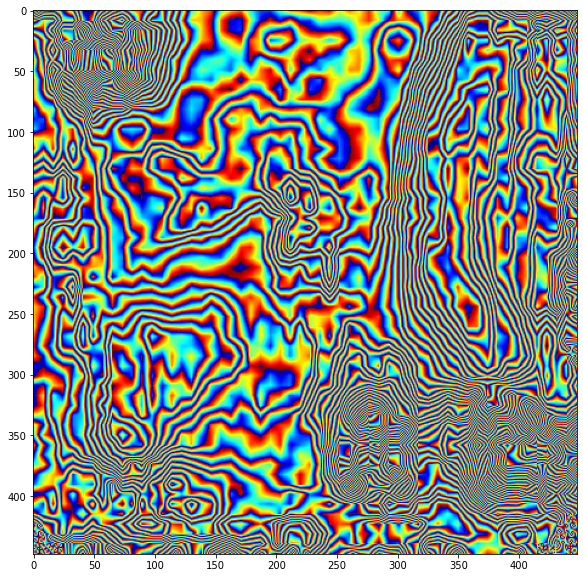

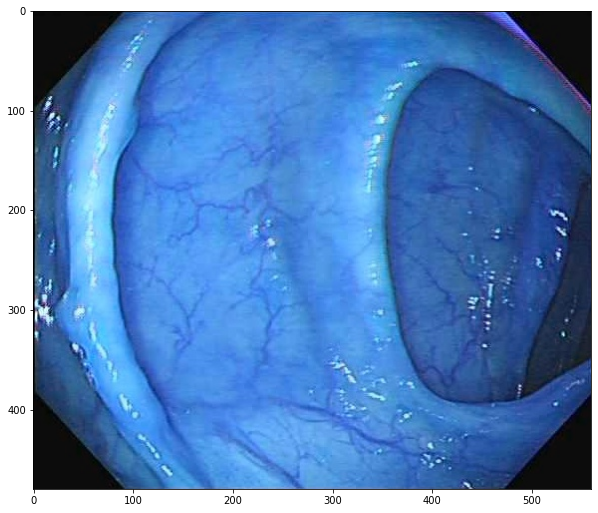


(448, 448, 3) tensor([[0., 1.]], dtype=torch.float64)


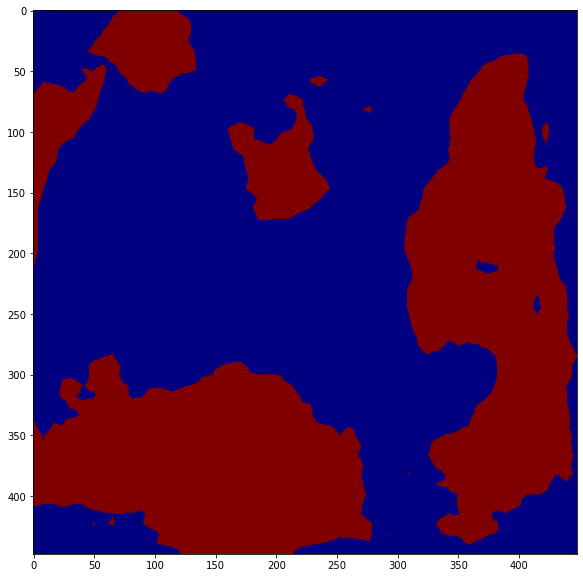

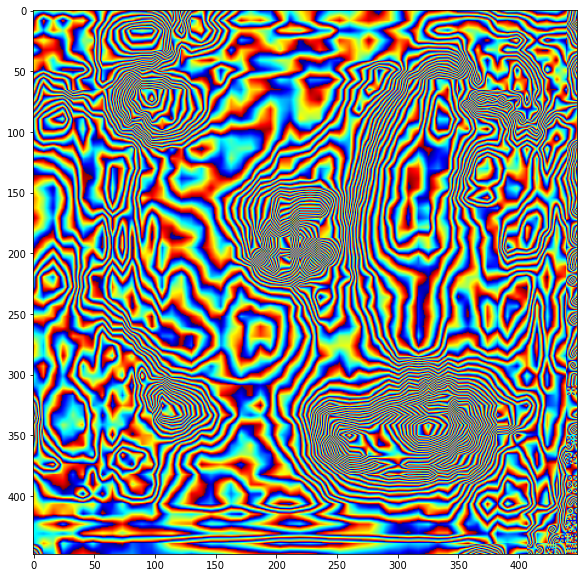

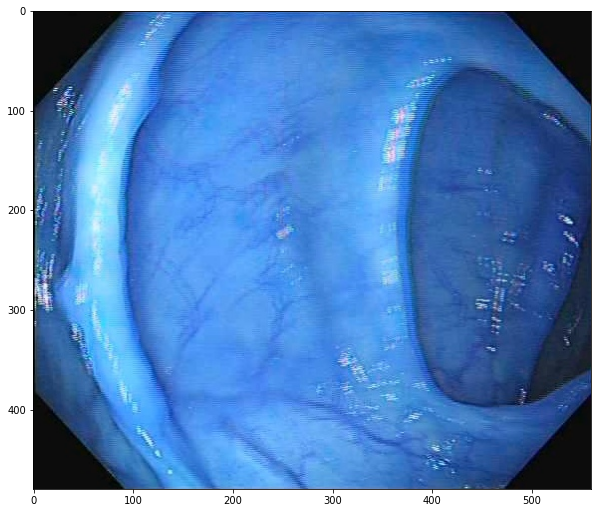


(448, 448, 3) tensor([[0., 1.]], dtype=torch.float64)


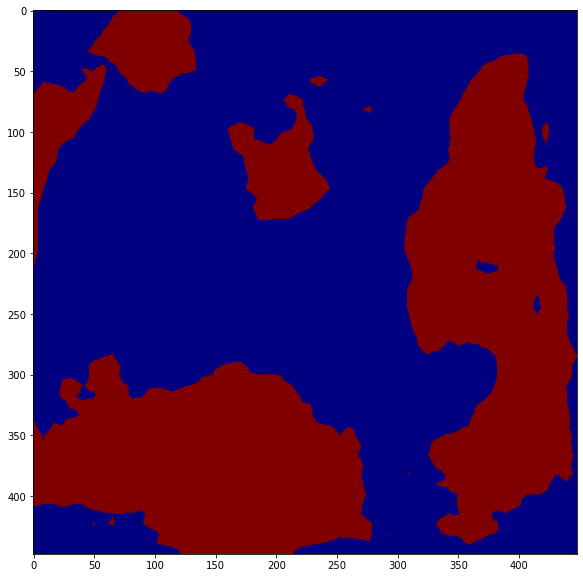

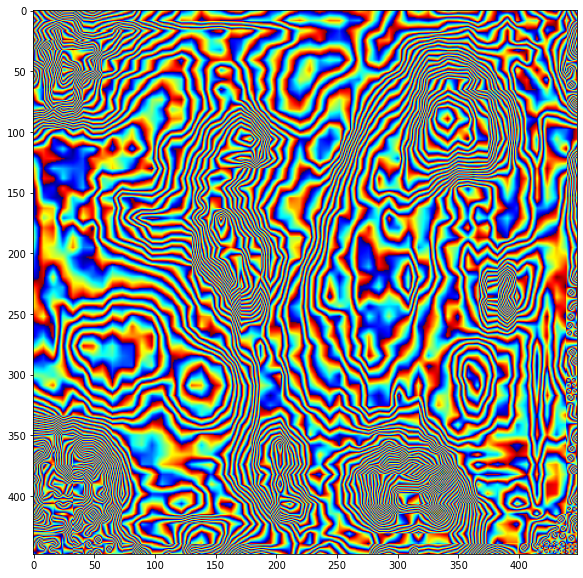

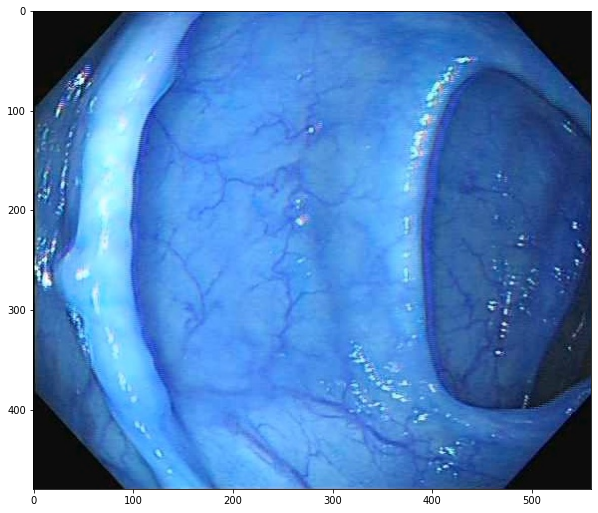


(448, 448, 3) tensor([[0., 1.]], dtype=torch.float64)


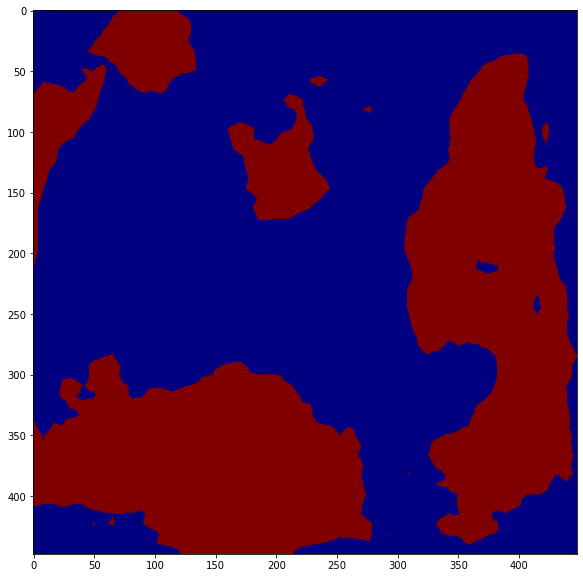

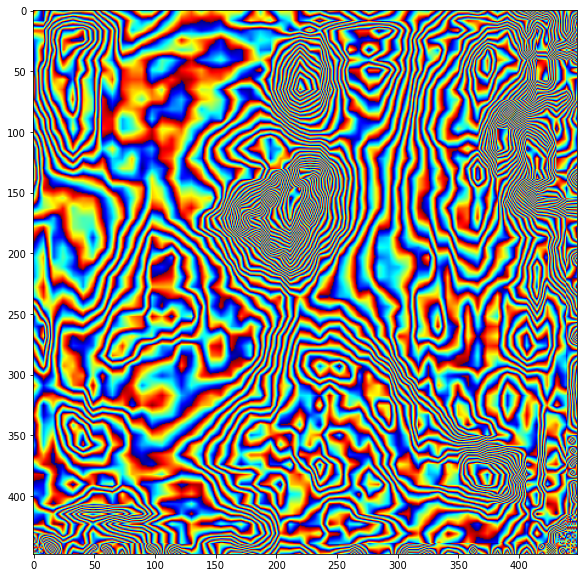

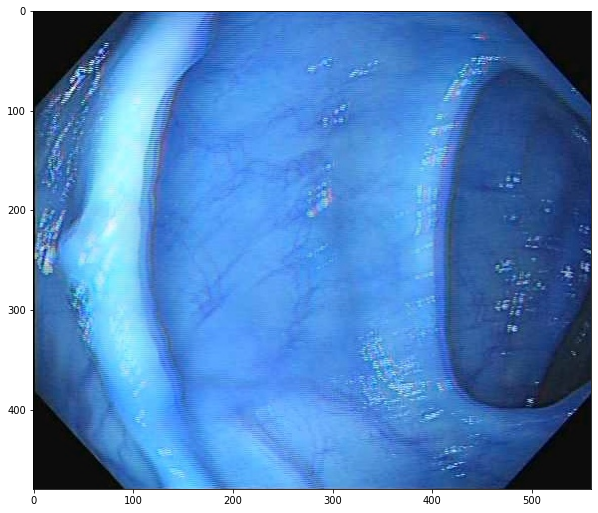


(448, 448, 3) tensor([[0., 1.]], dtype=torch.float64)


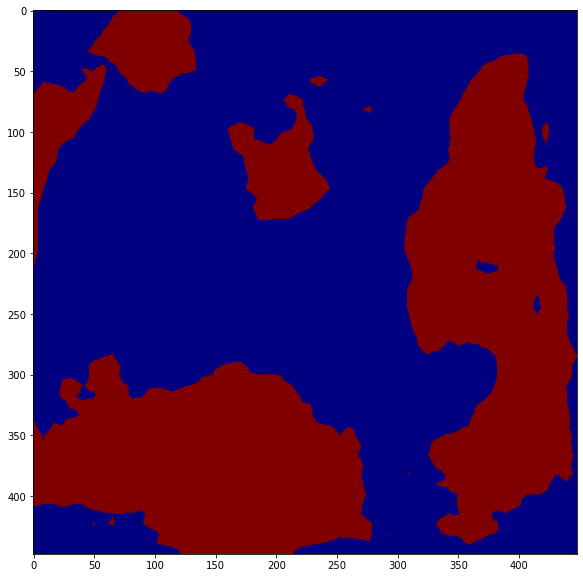

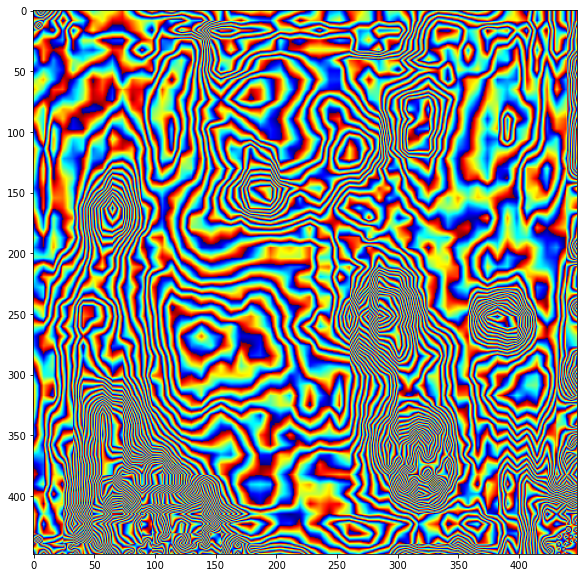

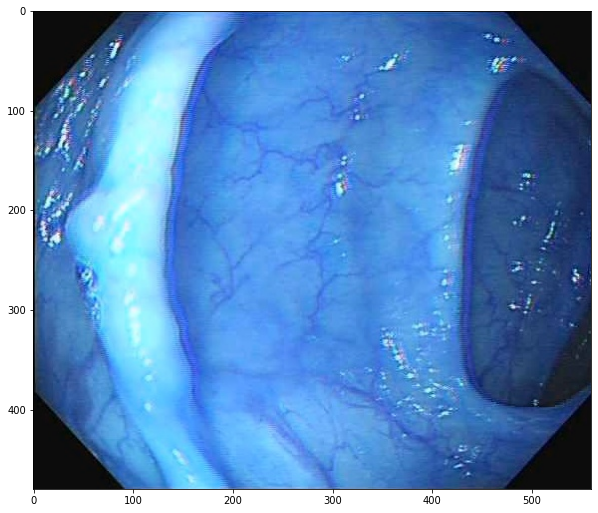


(448, 448, 3) tensor([[0., 1.]], dtype=torch.float64)


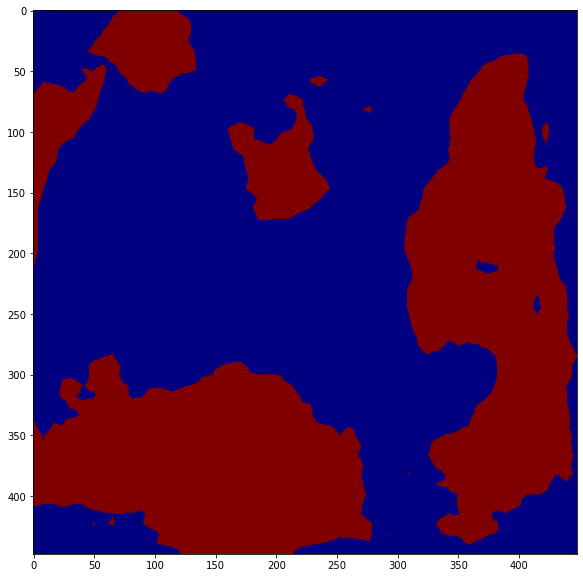

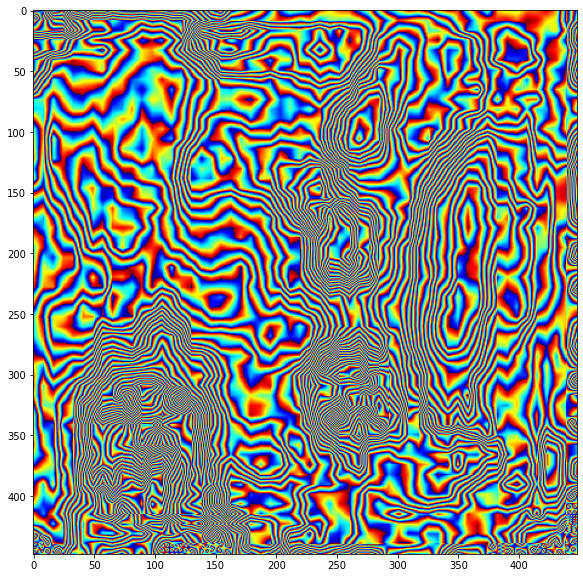

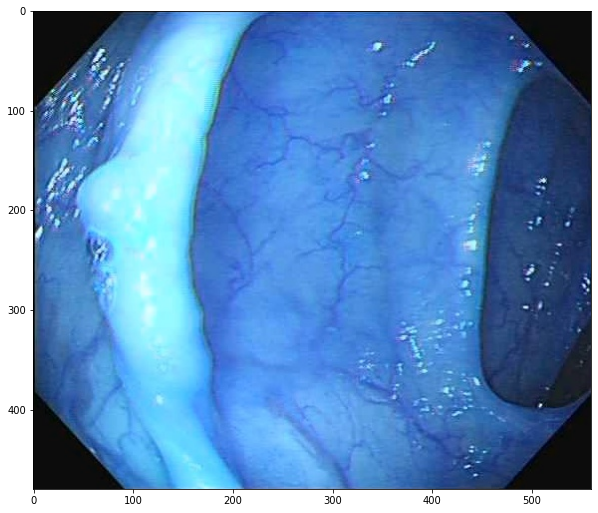

KeyboardInterrupt: Interrupted by user

In [33]:
infer_dataset = voc12.custom_data.PolypImageDataset(transform=transforms.Compose([
                        imutils.RandomResizeLong(448, 768),
                        np.asarray,
                        model.normalize,
                        imutils.RandomCrop(448),
                        imutils.HWC_to_CHW,
                        torch.from_numpy
                    ]))
infer_data_loader = DataLoader(infer_dataset, shuffle=False, pin_memory=True)

for iter, pack in enumerate(infer_data_loader):
    img_name = pack[0][0]
    src_img = cv2.imread(img_name)
    img = pack[1]
    label = pack[2]

    with torch.no_grad():
        cam_rv, cam = model(img.cuda())
#         cam = F.upsample(cam[:,1:,:,:], orig_img_size, mode='bilinear', align_corners=False)[0]
#         cam = cam.cpu().numpy() * label.clone().view(2, 1, 1).numpy()
    cam = cam_rv.cpu().numpy()[0].transpose([1, 2, 0])
    prob = np.argmax(cam, -1)
    heatmap = prob2heatmap(prob)
    print(heatmap.shape, label)
    heatmap1 = prob2heatmap(cam[..., 0])
    heatmap2 = prob2heatmap(cam[..., 1])
    plt.figure(figsize=(10, 10))
    plt.imshow(heatmap)
    plt.figure(figsize=(10, 10))
    plt.imshow(heatmap2)
    plt.figure(figsize=(10, 10))
    plt.imshow(src_img)
    plt.show()
    input()

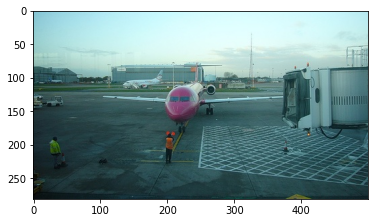

In [35]:
import matplotlib.pyplot as plt
plt.imshow(plt.imread('/data/sonnh8/SEAM/VOCdevkit/VOC2012/JPEGImages/2007_000032.jpg'))
plt.show()